# Flatfield correction and Phase retrieval

This short tutorial will demonstrate some capabilities of the maximus48 Python package on how to:
- make a flatifield correction on one file, using SSIM-similarity index
- how to scale a SSIM
- how to make phase retrieval with single-distance algorithms - Paganin, Bronnikov, CTF

For some details about the functions used, please refer to the desciption of functions in the corresponding .py files of the package.

The package can be downloaded with:
https://pypi.org/project/maximus48/

## SSIM for flatfield correction

SSIM is a well-known metrix to find a similarity between two images. It is nicely implemented in skimage:
https://scikit-image.org/docs/dev/auto_examples/transform/plot_ssim.html
However, in my package I slightly reduced some unnecessary features to make the algorithm work faster and be suitable for parallel processing

Let us start with a simple example with 2D image.

In [2]:
import numpy as np
from maximus48 import SSIM_131119 as SSIM
from maximus48 import var
import tifffile
import matplotlib.pyplot as plt

In [3]:
#set the ROI of image first, the logic corresponds to FIJI (to be read (x,y,x1,y1 at the image - inverse to numpy!)
ROI = (20,20,2048,2048) 

folder = '/Users/mpolikarpov/data_server/tomo/'

image_name = 'Platy-Platy_9902_1_01800.tiff'
image2_name = 'Platy-Platy_9902_1_01801.tiff'

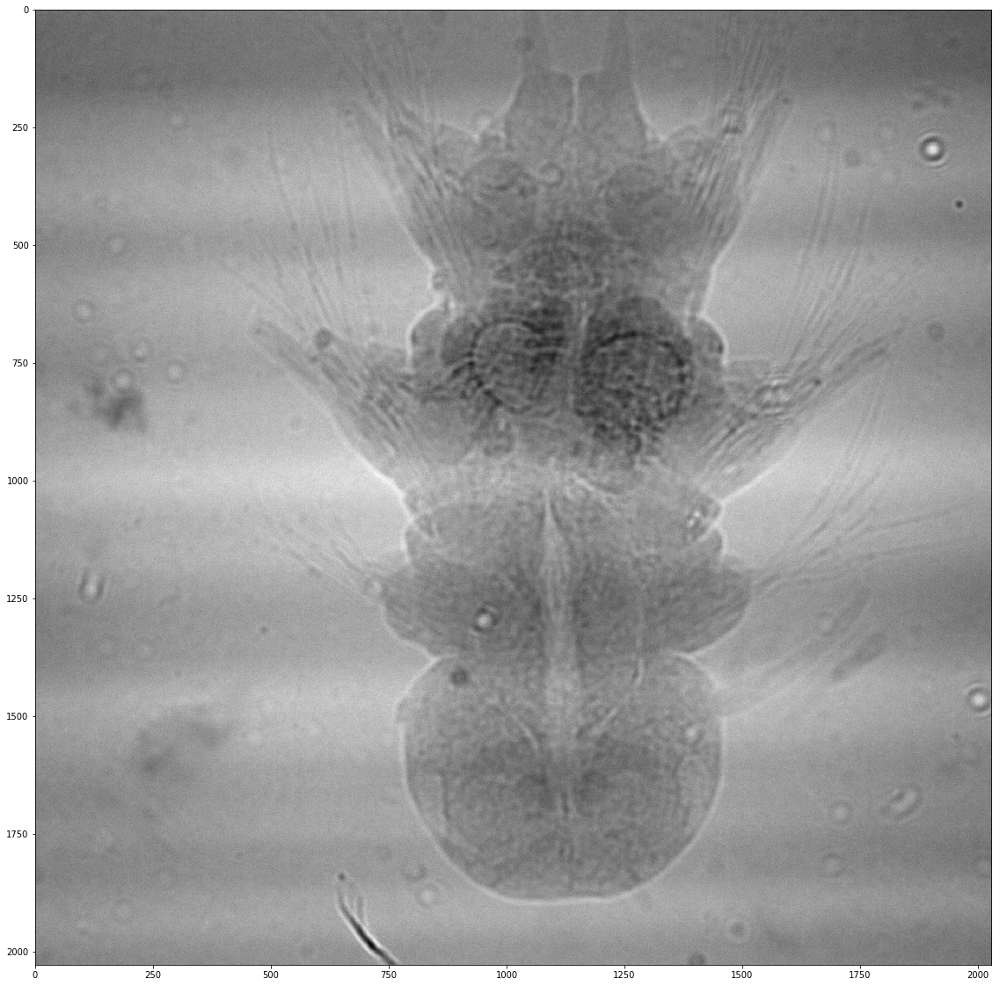

In [4]:
#let's read the image and crop it
image = tifffile.imread(folder+image_name)
image = image[ROI[1]:ROI[3], ROI[0]:ROI[2]]
var.show(image)

# please note - we used the built-in function var.show(), it is a bit modified version of matplotlib.pyplot.show()
# this is phase-contrast X-ray image, as you may guess from the contrast

the initial shape of flatfield-array is (30, 2028, 2028)
the final shape of flatfield-array is (2028, 2028, 30)


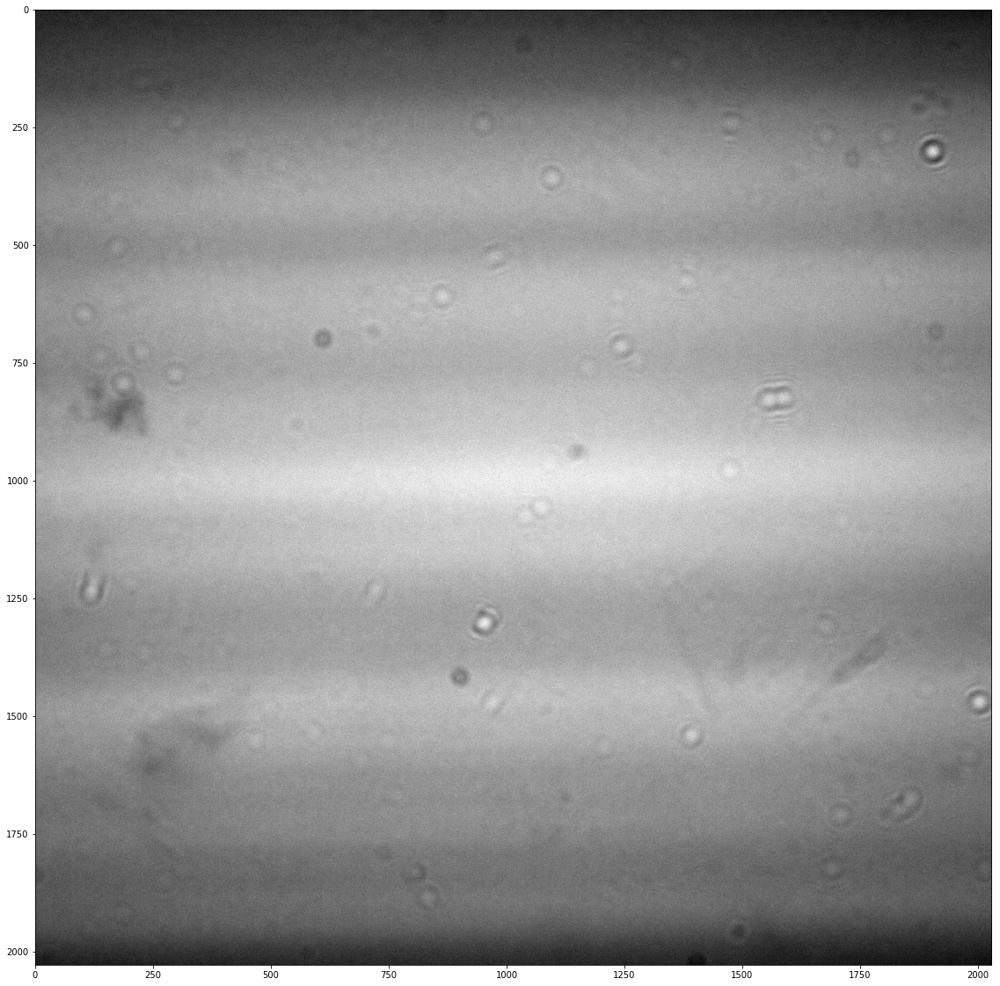

In [5]:
# now let's read all flatfield files from the folder
# in our case flatfield files start with the prefix 'ff_'

#create the list all images in the folder
imlist = var.im_folder(folder)

#read ff-files
flatfield = np.asarray([tifffile.imread(folder+im) for im in imlist if im.startswith('ff')])
flatfield = flatfield[:,ROI[1]:ROI[3], ROI[0]:ROI[2]]

# now it a 3D array of 30 images, stacked along 0-direction
print('the initial shape of flatfield-array is', flatfield.shape)

# each flatfield image looks like this, being however slightly different due to beam instabilities
var.show(flatfield[0])

# please transpose the ff-array for the further ff-correction
flatfield = np.transpose(flatfield, (1,2,0))
print('the final shape of flatfield-array is', flatfield.shape)

indexes of SSIM are:
  [0.33749406 0.42947686 0.4265769  0.43231087 0.43541652 0.42767532
 0.42258313 0.43774777 0.42236982 0.42791907 0.42847815 0.43778666
 0.43556595 0.43487642 0.4291258  0.43626136 0.42916336 0.42696763
 0.43347193 0.43756845 0.43520753 0.43089728 0.42623272 0.44496928
 0.43177588 0.4288381  0.43068098 0.43606087 0.4381501  0.42365624]


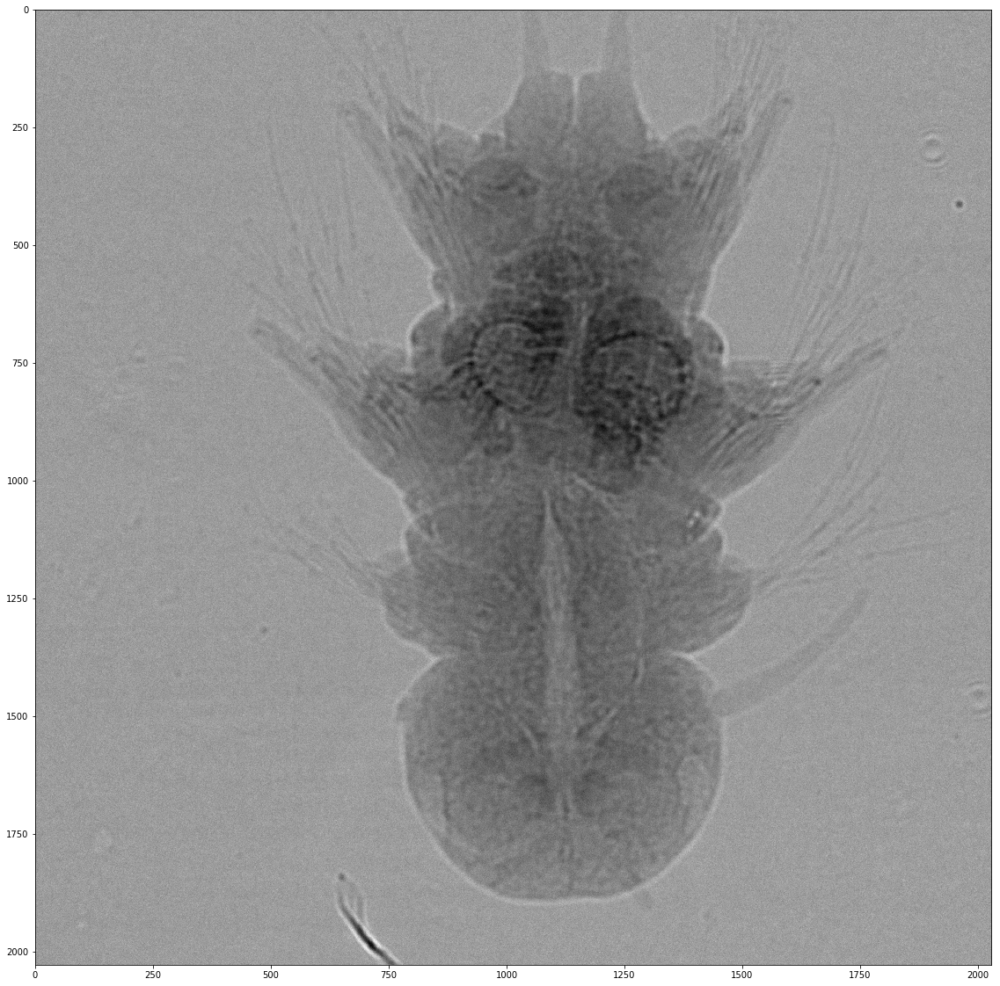

In [6]:
# let's divide our image by the flatfield, using SSIM metrix

# images should be set as special classes:
image_class = SSIM.SSIM_const(image)
ff_class = SSIM.SSIM_const(flatfield)

# then, you can calculate SSIM metrics for each pair (data-image) - (ff-image)
index = SSIM.SSIM(image_class, ff_class).ssim()
print('indexes of SSIM are:\n ', index)

# now, simply divide your image by flatfield-image with highest SSIM-index and get a corrected image:
result = image/flatfield[:,:,np.argmax(index)]
var.show(result)

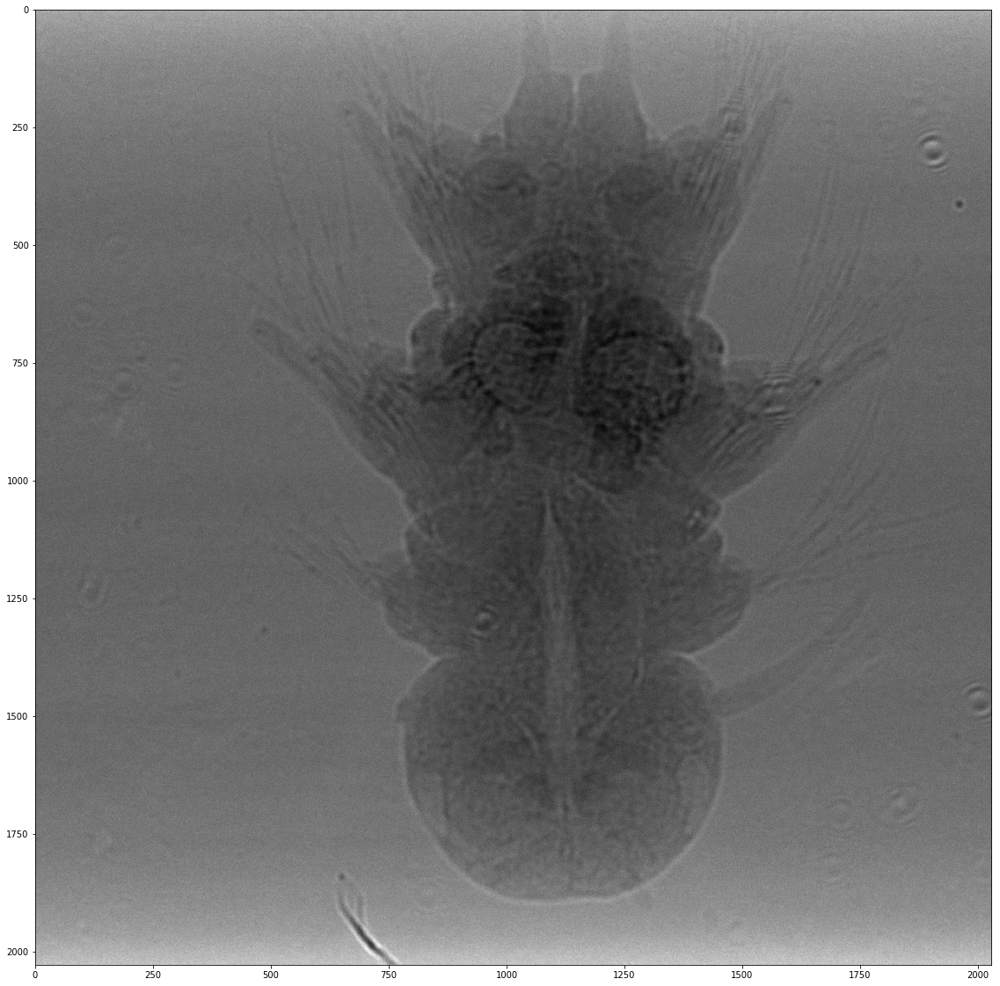

In [7]:
# compare with just a random division by a random ff-image below
bad_result = image/flatfield[:,:,0]
var.show(bad_result)

See, how worse the filtering is (ringy artifacts and horizontal stripes). In addition, the filtration is bad at the edges of the image

## SSIM for 3D array of images using multiprocessing (advanced)

Now, let's assume that you have a 3D array of images. The proper way to handle this would be to follow the similar logic as before, however implementing some parallelization. While a simple for loop will be the easiest solution, here I will show the case of using python multiprocessing.

In [8]:
import os
from multiprocessing import Pool
from maximus48.tomo_proc2 import F, tonumpyarray
from contextlib import closing

# fdon't forget to switch off all low-level C-based parallelisation from numpy etc. - gonna be mess otherwise
os.environ['OMP_NUM_THREADS'] ='1'
os.environ['OPENBLAS_NUM_THREADS'] = '1'
os.environ['MKL_NUM_THREADS'] = '1'

We will be using a standard Python high-level parallelisation with Pool. Some things to consider there:
- if you want to make things properly, avoid sharing global variables between workers. As you remember from the previous example, we had two arrays - data and flatfield. 
- a good strategy will be to calculate ff-related constants ouside of the Pool, and pass ff-data + ff-constants to the shared memory.
- read and write from/to the shared memory inside the process.
- read data images directly from disk inside the process. 

In [9]:
# allocate memory to store flatfield. I do it with a custom class which is based on multiprocessing.Array()
shape_ff = ROI[3]-ROI[1], ROI[2]-ROI[0], 30 
ff_shared = F(shape = shape_ff, dtype = 'd')

# read ff-files to memory
ff = tonumpyarray(ff_shared.shared_array_base, ff_shared.shape, ff_shared.dtype)
flatfields = np.asarray([tifffile.imread(folder+im) for im in imlist if im.startswith('ff')])[:,ROI[1]:ROI[3], ROI[0]:ROI[2]].transpose(1,2,0)
for i in range(flatfields.shape[2]):
    ff[:,:,i] = flatfields[:,:,i]
    
# calculate a class of flatfield-related constants (skipped shared memory because it is rather small array)
ff_con = SSIM.SSIM_const(ff)

In [10]:
# initializer to define which variables will be global 

def init():
    global proj, ff_shared, ff_con, ROI, image_paths
   

# main function

def Processor(j):
    """
    j: int
        an index of the file that should be processed 
    Please note, j always starts from zero
    To open correct file, images array uses images[i][j + N_start-1]
    """
    
    #set local variables (unwrap array from shared memory)
    ff = tonumpyarray(ff_shared.shared_array_base, ff_shared.shape, ff_shared.dtype)
    proj_loc = tonumpyarray(proj.shared_array_base, proj.shape, proj.dtype)
    
    #read image and do ff-retrieval    
    im = tifffile.imread(image_paths[j])[ROI[1]:ROI[3], ROI[0]:ROI[2]]       
    index = SSIM.SSIM(SSIM.SSIM_const(im), ff_con).ssim()
    
    #save result to the shared memory
    proj_loc[j] = im/ff[:,:,np.argmax(index)]

In [11]:
# set paths of data files
image_paths = (folder+image_name, folder+image2_name)

# allocate memory to store filtered files (only two in my example)
N_files = len(image_paths)
proj = F(shape = (N_files, shape_ff[0], shape_ff[1]), dtype = 'd' )

In [12]:
# Finally, make it all work
cp_count = 3
with closing(Pool(cp_count, initializer = init)) as pool:    
    pool.map(Processor, np.arange(len(image_paths)))

Let's see what we got

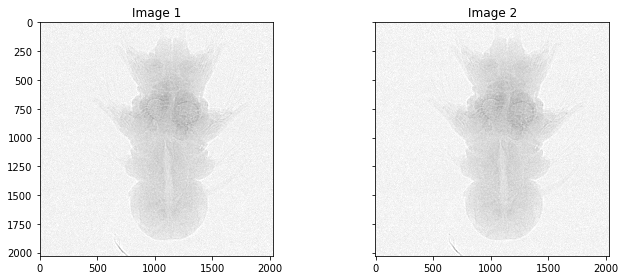

In [13]:
out = tonumpyarray(proj.shared_array_base, proj.shape, proj.dtype)

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 4),
                         sharex=True, sharey=True)
ax = axes.ravel()
ax[0].imshow(out[0], cmap='gray', vmin=0, vmax=1)
ax[0].set_title('Image 1')

ax[1].imshow(out[1], cmap='gray', vmin=0, vmax=1)
ax[1].set_title('Image 2')

plt.tight_layout()
plt.show()

This is it. You can scale it to big data.


# Single-distance Phase retrieval algorithms

This section is dedicated to simple phase-retrieval with single-distance algorithms. 
I highly recommend this book to get a comprehensive understanding of maths behind:
"
T.Salditt et al 2017. 
Biomedical Imaging. 
Principles of Radiography, Tomography and Medical Physics
"

In [14]:
pixel = 0.1625 * 1e-6                 # pixel size 
distance = 6.25 * 1e-2                # distances for your measurements
energy = 18                           # photon energy in keV

wavelength = var.wavelen(energy)
fresnelN = pixel**2/(wavelength*distance)

# I will use the image from the previous example
filtered = out[0]

## Paganin algorithm:

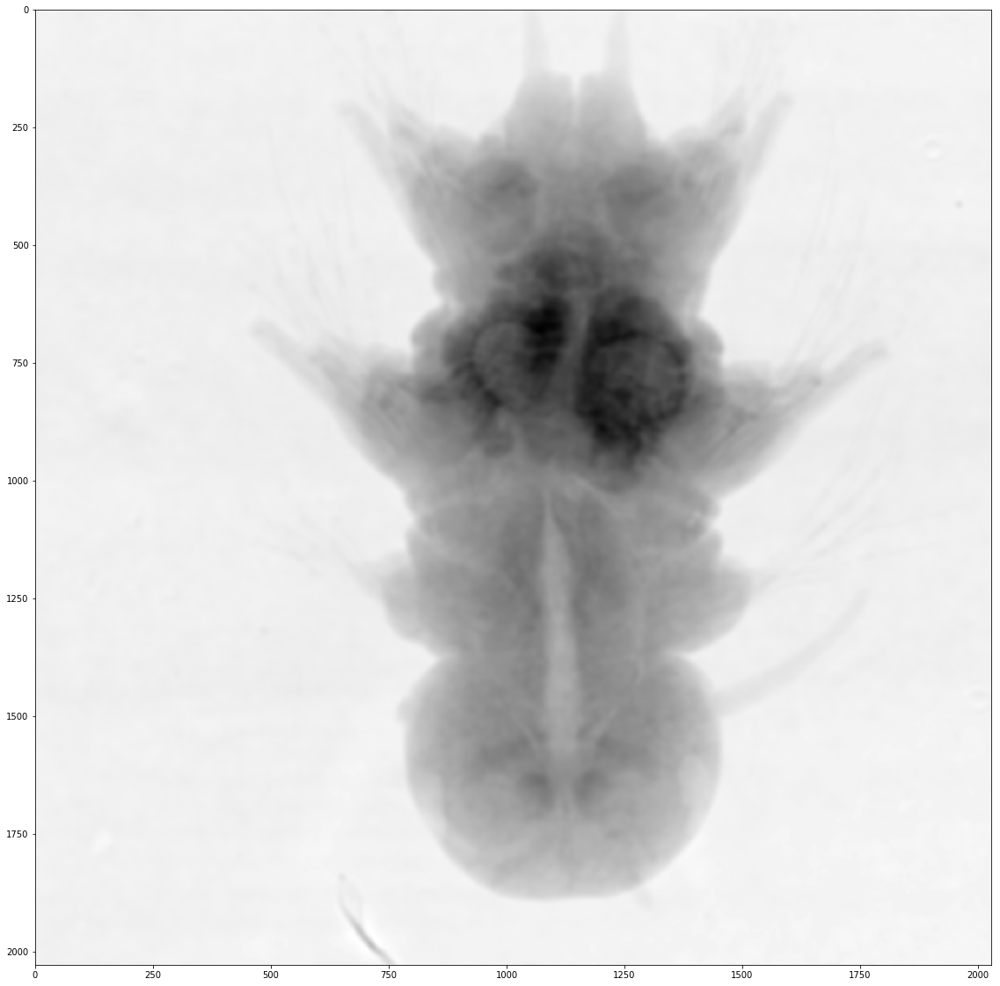

In [15]:
import maximus48.sidi_phare as phare

# Paganin algorithm
beta_delta_paganin = 0.1 #0.5
test_paganin = phare.Paganin(filtered, fresnelN, beta_delta_paganin)
var.show(test_paganin)

Note, that Paganin reconstruction retrieves the phase but blurs the image. There is possibility to use unsharp filter to make image sharper (check the formalism here - https://scripts.iucr.org/cgi-bin/paper?mo5009):

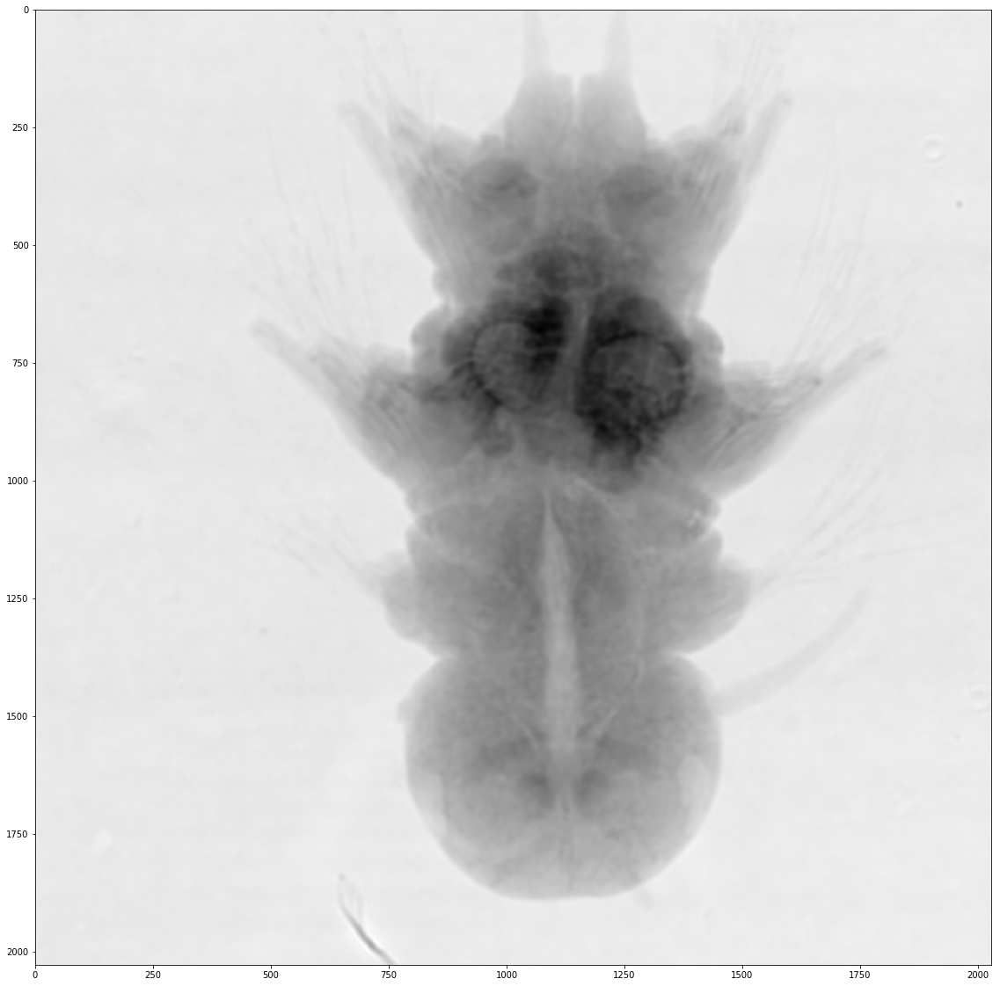

In [16]:
w = 2 #width of gauss kernel 
stabilizer = 0.3 # weight
proba = phare.anka_filter(test_paganin, w, stabilizer)
var.show(proba)

See, it became sharper because we used high frequencies from the original image

## Modified Bronnikov Algorithm (the same logic and similar results as for Paganin). 

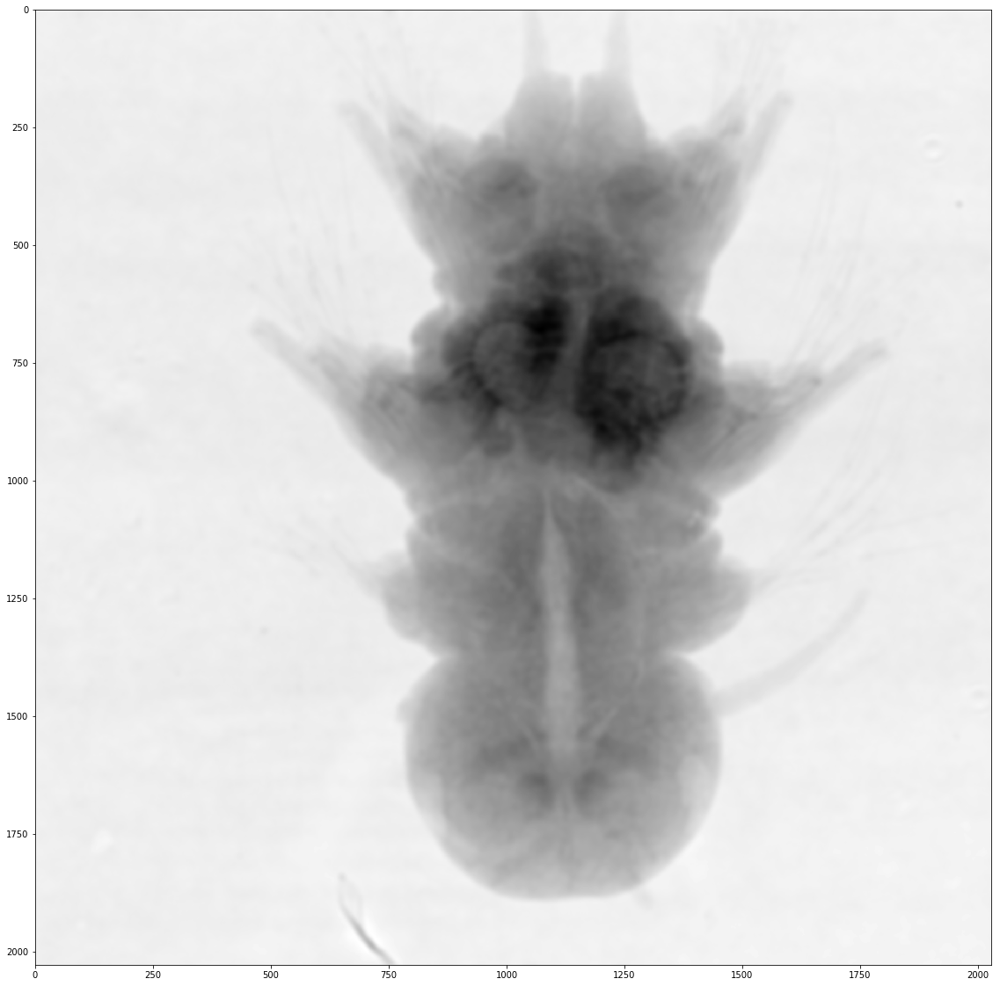

In [17]:
#Modified Bronnikov Algorithm
beta_delta_MBA = 0.1
test_MBA = phare.MBA(filtered, fresnelN, beta_delta_MBA)
var.show(test_MBA)

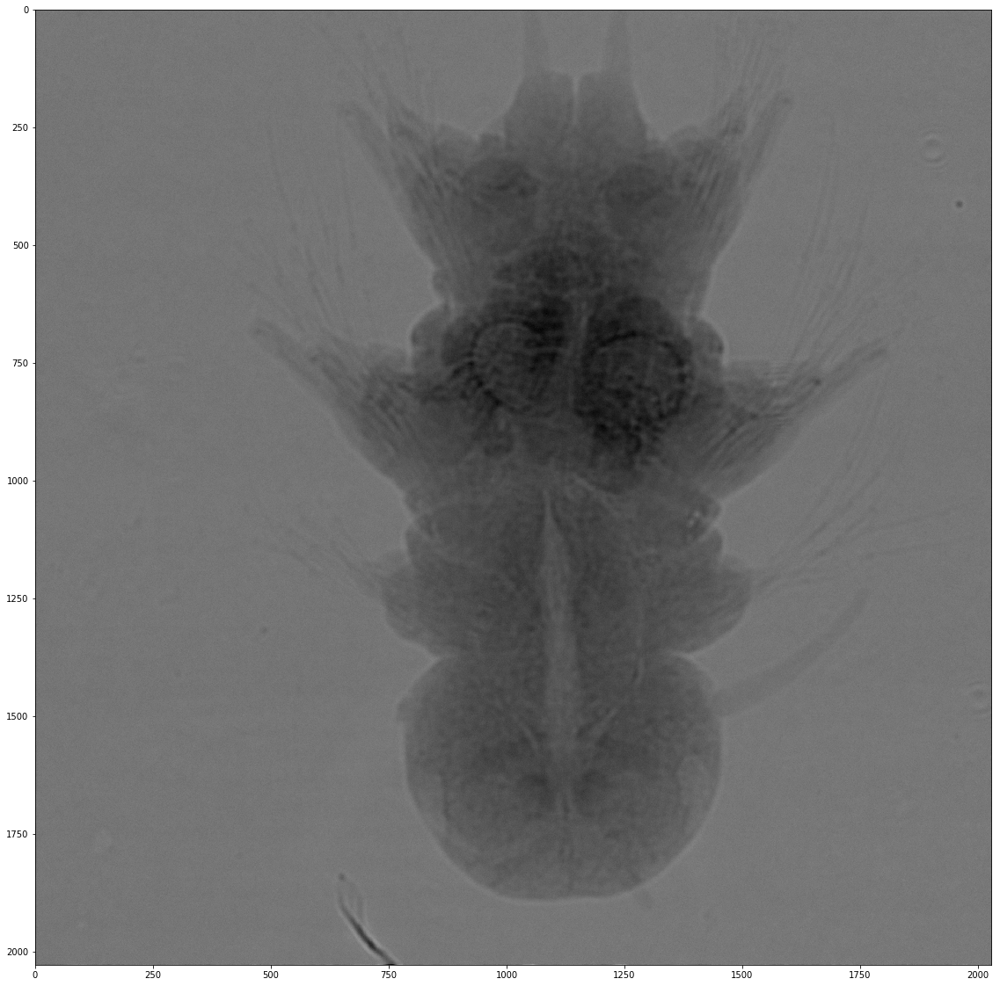

In [18]:
# Bronnikov Aided Correction
# gamma is a weight of the filter - the same logic as for unsharp filter in Paganin
gamma = 0.1 

test_BAC = phare.BAC(filtered, fresnelN, beta_delta_MBA, gamma)
var.show(test_BAC)

## Single-distance CTF (Cloetens et al)

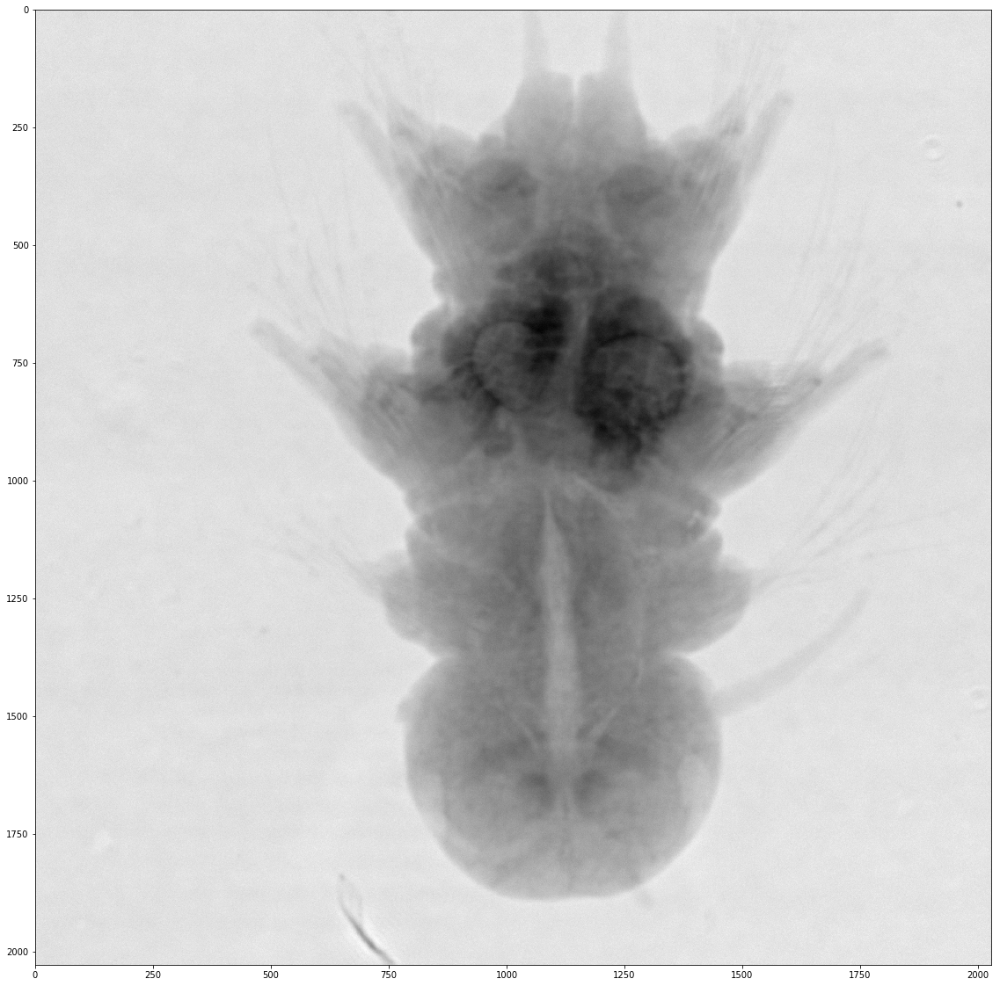

In [19]:
# CTF retrieval 
from maximus48 import monochromaticCTF as CTF

beta_delta = 0.15               
zero_compensation = 0.1 #parameter to cut-off higher frequencies

test_CTF = CTF.single_distance_CTF(filtered, beta_delta, fresnelN, zero_compensation)
var.show(test_CTF)

As you may see, it gives nice results, comparable to Paganin filter in terms of speed and phase retrieval. However, when used with a single distance, this filter introduces stripe artifacts (see below). The best way to minimize them is to use at least 4-distance phase retrieval. Check my other example to get understanding of how it can be done. 

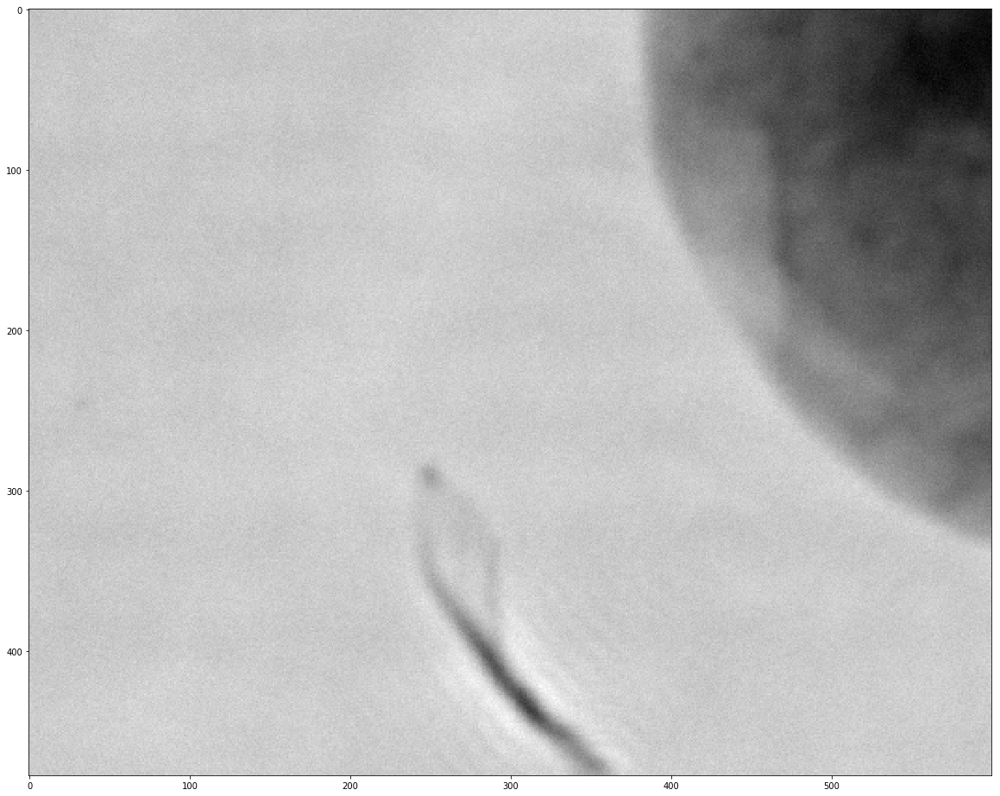

In [20]:
var.show(test_CTF[1550:,400:1000])

In [21]:
%reset

Once deleted, variables cannot be recovered. Proceed (y/[n])? y
